# Self-Driving Car Engineer Nanodegree

## Project: Advanced Lane Lines

***
## Import Packages

In [1]:
#importing useful packages
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Camera Calibration: Helper Functions

Firstly calibration needs to be performed for the camera thats going to be used for cpaturing videos.  By performing this calibration, the image will appear as undistorted. The functions to be used are as follows:<br><br>
`calibrate():` To return the camera matrix and distortion coefficients<br>
`undistort():` Undistorts the image <br>

In [2]:
import glob

def calibrate():
    
    nx = 9
    ny = 6
    
    objp = np.zeros((ny*nx,3),np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)  
    
    objpoints = []
    imgpoints = []
    
    images = glob.glob('camera_cal/calibration*.jpg')
    img_shape = []
    
    for fname in images:
        
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        
        if len(img_shape)<1:
            img_shape = gray.shape[::-1]
            
        ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)
    
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,imgpoints,img_shape,None,None)
    
    return mtx, dist

def undistort(img,mtx,dist):
    
    return cv2.undistort(img,mtx,dist,None,mtx)

## Function for visualizing images

In [3]:
def display_image(img_list,img_name,cols = 2, 
                size = (15,15), isSave = False,
                filename = "file"):

    cmap = None
    rows = np.round(len(img_list) / cols ) 
    plt.figure(figsize=size)
    
    img_name = np.array(img_name)
    
    for i,img in enumerate(img_list):
        name = img_name[i]
        img_c = np.copy(img)
        
        plt.subplot(rows,cols,i+1)
        if len(img_c.shape)<3:
            cmap = "gray"
        
        plt.title(name)
        plt.imshow(img_c,cmap=cmap)
    
    plt.tight_layout()
    
    if(isSave == True):
        plt.savefig(filename, bbox_inches = 'tight')
    plt.show()

## Undistorting Images

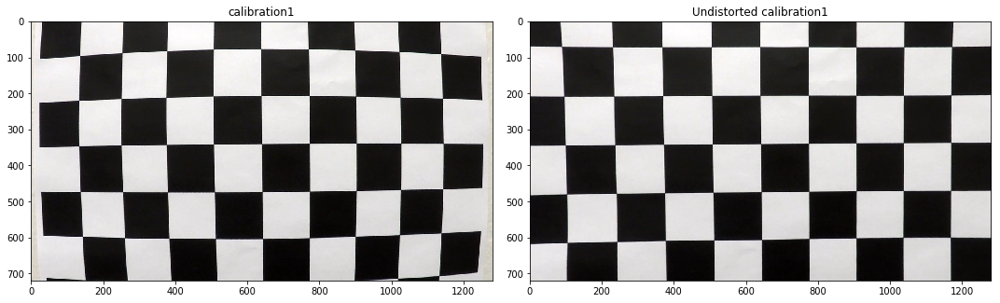

In [4]:
mtx, dis = calibrate()

cal_path = 'camera_cal/calibration1.jpg'

test = mpimg.imread(cal_path)
cal_img = undistort(test,mtx,dis)

cal_img = np.expand_dims(cal_img,axis = 0)
test = np.expand_dims(test,axis = 0)

cal_compare = list(zip(test,cal_img))
                   
for i,imgs in enumerate(cal_compare):
    name = 'calibration1'
    display_image(imgs,img_name = [name,'Undistorted '+name],
                  cols =2, size = (15,15), isSave = True,
                  filename = 'readme_files/ChessBoard{}'.format(i+1))                  

In [5]:
path = "test_images/"

imgs_name = list(os.listdir(path))
imgs = list(map(lambda name: path + name,imgs_name))
imgs = list(map(lambda img: mpimg.imread(img),imgs))

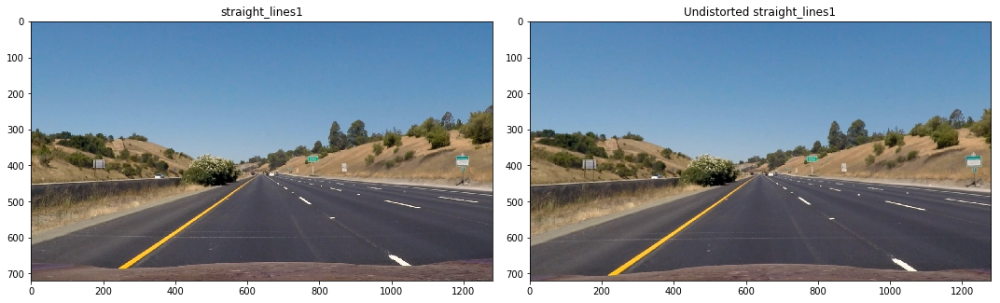

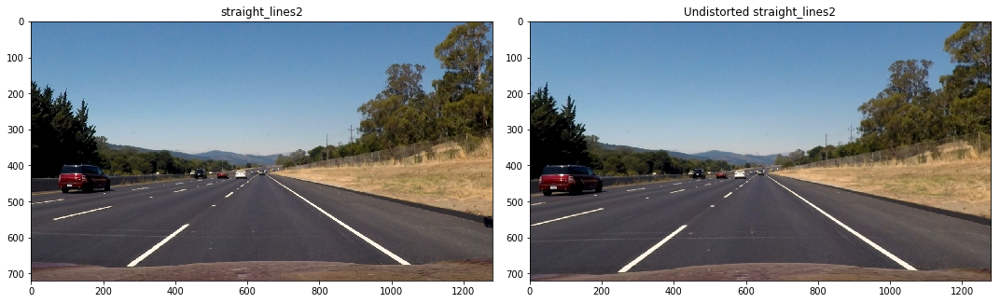

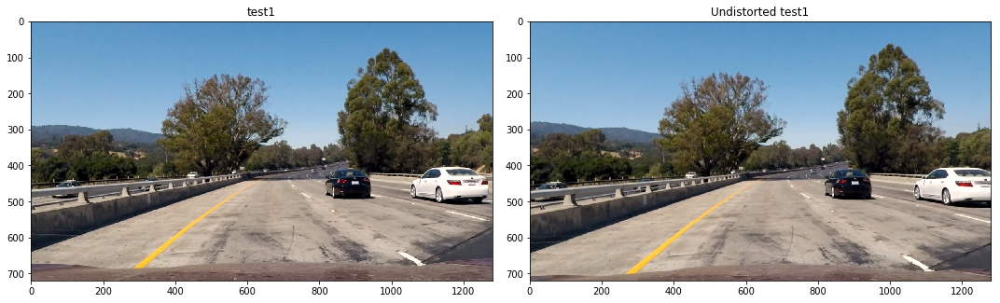

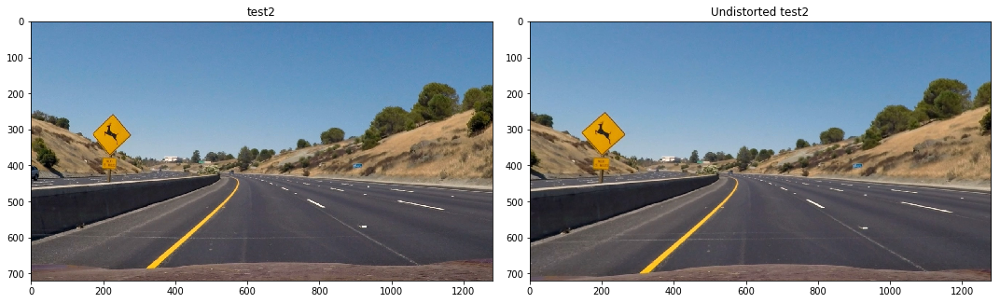

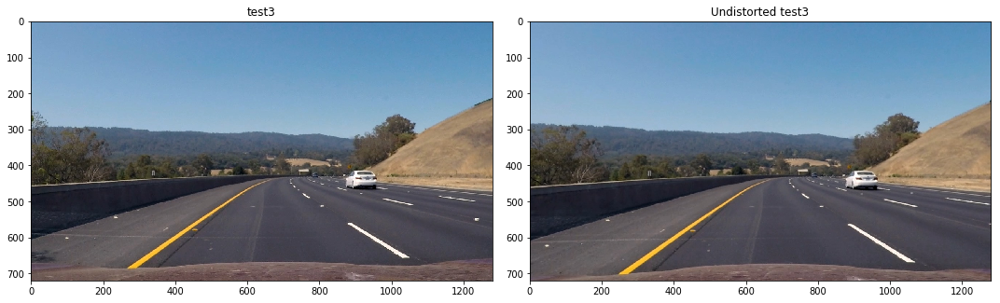

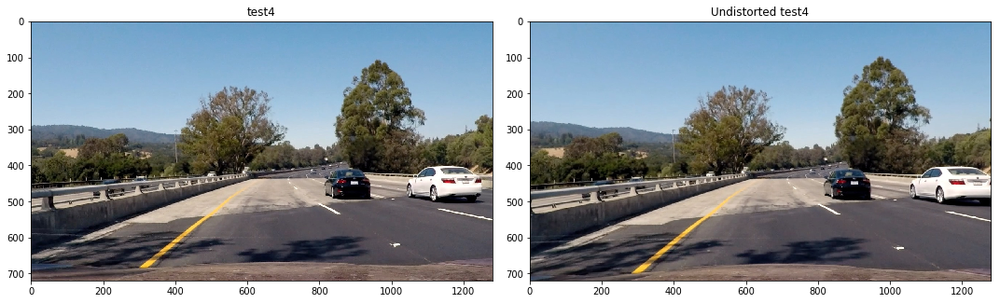

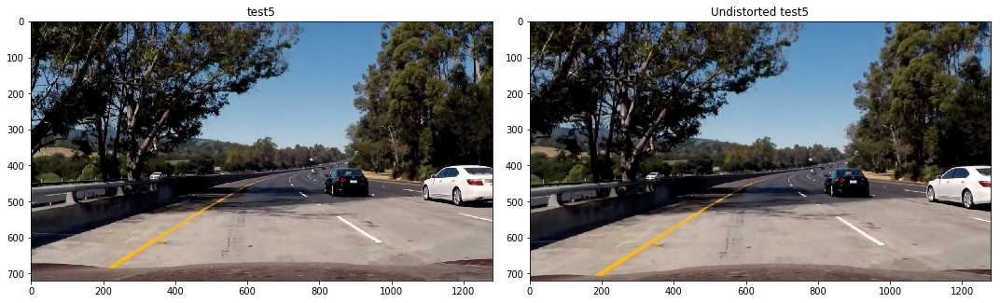

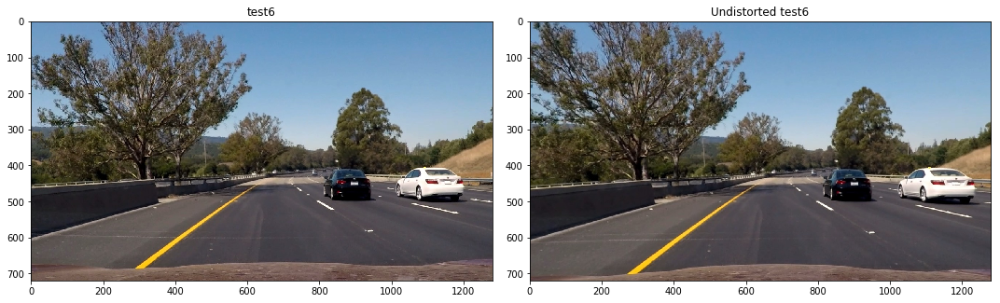

In [6]:
imgs_undistorted = list(map(lambda imgs: undistort(imgs,mtx,dis),imgs))

comparison = list(zip(imgs,imgs_undistorted))

for i,imgs in enumerate(comparison):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,'Undistorted '+name],
                  cols =2, size = (15,15), isSave = True,
                  filename = 'readme_files/Undistorted{}'.format(i+1))

## Lane Detection: Helper Functions

These following functions will be used to detect lane lines on the road: <br><br>
`convert_gray():` Converting to grayscale <br>
`convert_hls():` Converting to HLS color space <br>
`Sobelx():` Applying Sobel in the **x** direction <br>
`separateChannel():` Returning a specified range of a single channel <br>
`combine_binary():` Combining 2 binary images together <br>

In [7]:
def convert_gray(img):
    """
    returns a gray image
    
    input:  image as an array read using mpimg.imread()
            use the following if read using cv2.imread()
            "return cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)"
            
    output: converted gray img 
    """
    
    return cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
def convert_hsl(img):
    """
    returns an image in HLS Color Space
    
    input:  image as an array read using mpimg.imread()
            use the following if read using cv2.imread()
            "return cv2.cvtColor(img,cv2.COLOR_BGR2HLS)"
            
    output: converted img in HLS Color Space
    """
    
    return cv2.cvtColor(img,cv2.COLOR_RGB2HLS)

def convert_hsv(img):
    """
    returns an image in HLS Color Space
    
    input:  image as an array read using mpimg.imread()
            use the following if read using cv2.imread()
            "return cv2.cvtColor(img,cv2.COLOR_BGR2HSV)"
            
    output: converted img in HLS Color Space
    """
    
    return cv2.cvtColor(img,cv2.COLOR_RGB2HSV)

def separateChannel(img,channel = 2,thresh = [200,255]):
    """
    returns a specified range in a single channel of an image
    
    input: an image in any Color Space.
    
    output: a specified range in a single channel of an image
    """
    
    channel = img[:,:,channel]
    
    sbinary = np.zeros_like(channel)
    sbinary[(channel>=thresh[0]) & (channel<=thresh[1])] = 1
    
    return sbinary


def combine_colorSpace(img1,img2):
    
    combined_color = np.zeros_like(img1)
    combined_color[(img1==1) | (img2==1)] = 1
    
    return combined_color
    
    
def abs_sobelx_thresh(img, ksize=3, thresh=(30,50)):
    """
    returns a derivative of an image in a specified direction
    through Sobel Filtering
    
    input: image as an array read using mpimg.imread() or cv2.imread()
    
    output: image derivate as an array
    
    """
    gray = convert_gray(img)

    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=ksize)
    
    abs_sobelx = np.absolute(sobelx)
    
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sbinary = np.zeros_like(scaled_sobelx)
    sbinary[(scaled_sobelx>=thresh[0]) & (scaled_sobelx<thresh[1])] = 1
    
    return sbinary

def mag_sobel_thresh(img,ksize=9,thresh= (60,100)):
    """
    returns a derivative of an image in a specified direction
    through Sobel Filtering
    
    input: image as an array read using mpimg.imread() or cv2.imread()
    
    output: image derivate as an array
    
    """
    
    gray = convert_gray(img)

    Sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=ksize)
    Sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=ksize)
    
    abs_sobelxy = np.sqrt(Sobelx**2+Sobely**2)
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel>=thresh[0]) & (scaled_sobel<=thresh[1])] = 1  
    
    return mag_binary

def dir_sobel_thresh(img,ksize=15,thresh= (0.7,1.3)):
    """
    returns a derivative of an image in a specified direction
    through Sobel Filtering
    
    input: image as an array read using mpimg.imread() or cv2.imread()
    
    output: image derivate as an array
    
    """
    
    gray = convert_gray(img)

    Sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=ksize)
    Sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=ksize)
    
    abs_sobelx = np.absolute(Sobelx)
    abs_sobely = np.absolute(Sobely)
    
    direction = np.arctan2(abs_sobely,abs_sobelx)

    sbinary = np.zeros_like(direction)
    sbinary[(direction>=thresh[0]) & (direction<=thresh[1])] = 1  
    
    return sbinary

def combine_sobel(abs_binary,mag_binary,dir_binary):
    """
    returns a combined binary of 2 binary images
    
    input: binary images in 0's and 1's 
    
    output: combined/overlaped binary images
    """
    
    combined_binary = np.zeros_like(abs_binary)
    combined_binary[(abs_binary==1) | ((mag_binary==1) & (dir_binary==1))] = 1
    
    return combined_binary

## Testing images

Testing images from the directory `\test_images` before applying the pipeline.

In [8]:
imgs_hsl = list(map(lambda img:separateChannel(convert_hsl(img),thresh = (160,255),channel = 1), imgs_undistorted)) 
imgs_hsv = list(map(lambda img:separateChannel(convert_hsv(img), thresh = (230,255)),imgs_undistorted))

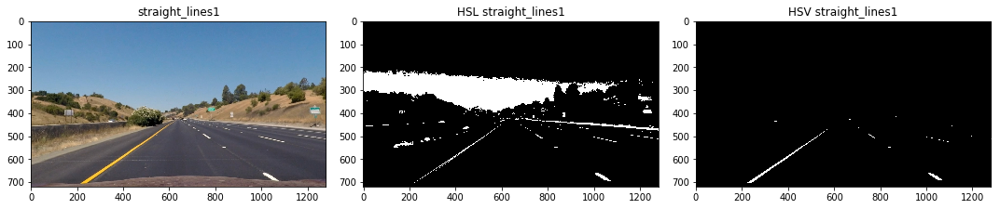

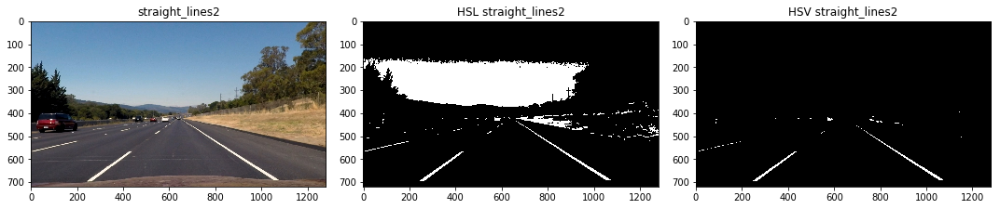

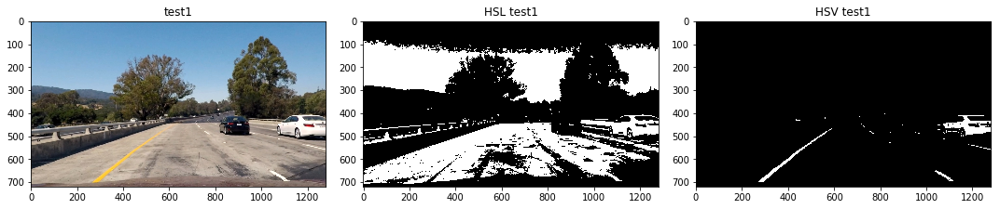

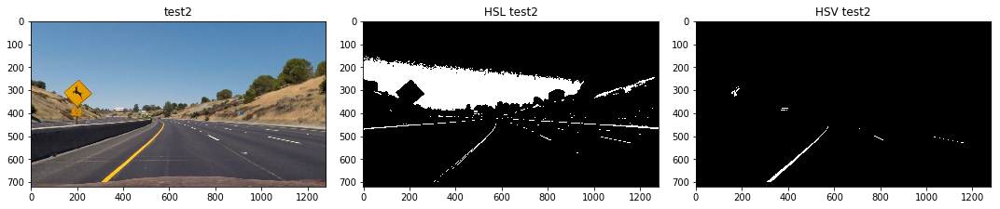

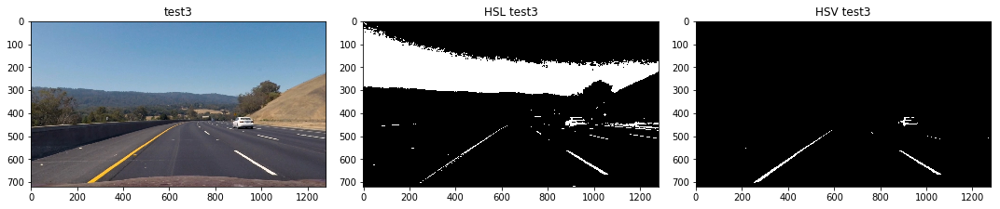

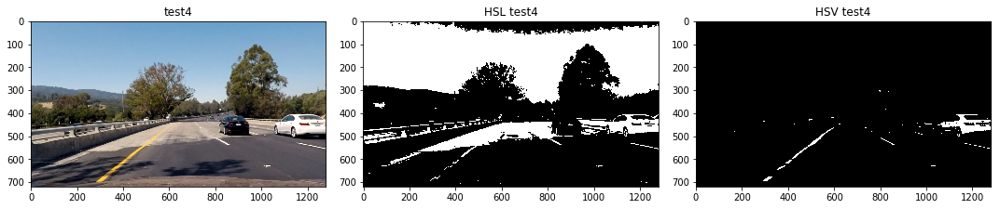

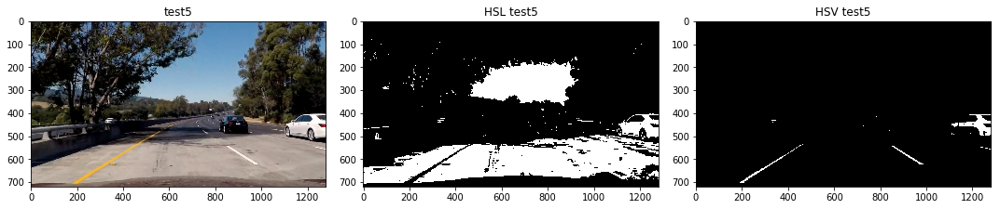

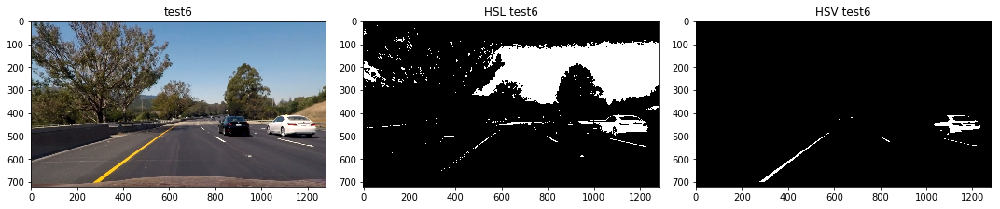

In [9]:
color_space = list(zip(imgs_undistorted,imgs_hsl,imgs_hsv))

for i,imgs in enumerate(color_space):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,'HSL '+name, 'HSV '+name],
                  cols = 3, size = (15,15), isSave = True,
                  filename = 'readme_files/Isolated{}'.format(i+1))

In [10]:
imgs_abs_sobel = list(map(lambda img:abs_sobelx_thresh(img),imgs_undistorted))
imgs_mag_sobel = list(map(lambda img:mag_sobel_thresh(img),imgs_undistorted))
imgs_dir_sobel = list(map(lambda img:dir_sobel_thresh(img),imgs_undistorted))

sobel_combined = list(map(lambda aS,mS,dS:combine_sobel(aS,mS,dS),imgs_abs_sobel,imgs_mag_sobel,imgs_dir_sobel))

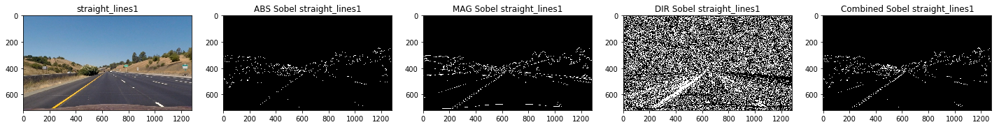

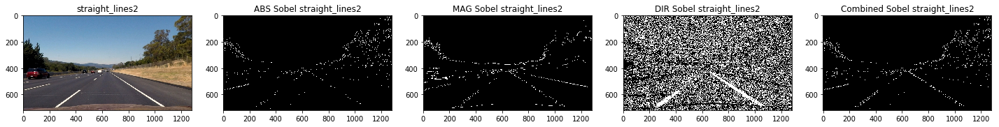

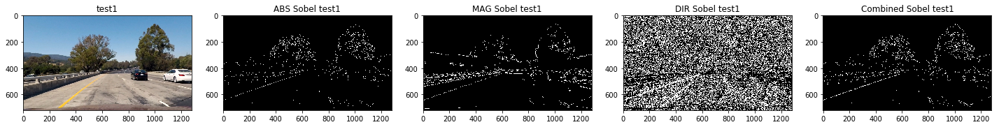

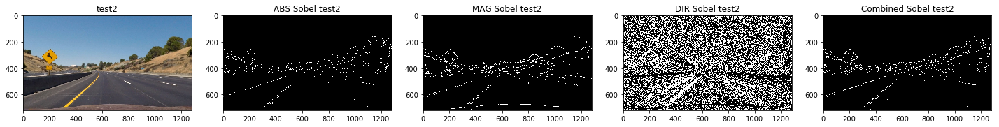

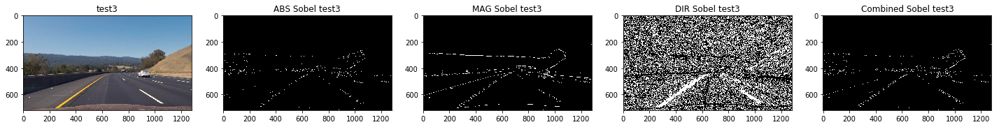

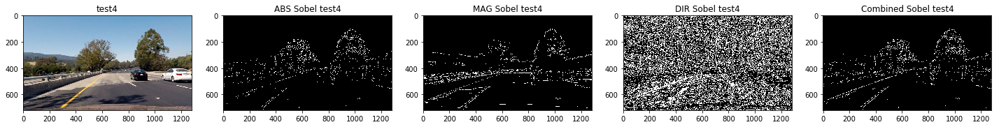

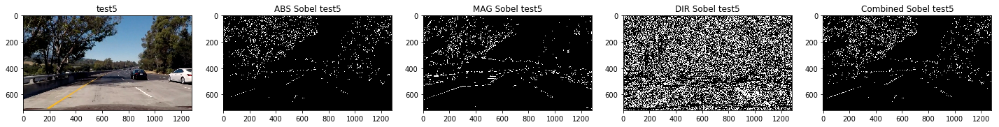

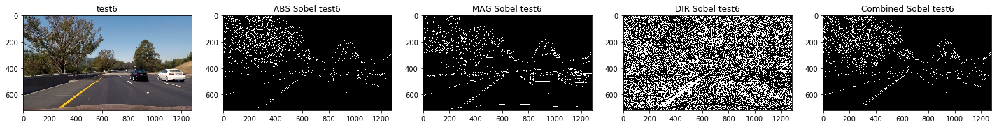

In [11]:
sobel_images = list(zip(imgs_undistorted,imgs_abs_sobel,imgs_mag_sobel,imgs_dir_sobel,sobel_combined))

for i,imgs in enumerate(sobel_images):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,'ABS Sobel '+name,'MAG Sobel '+name,'DIR Sobel '+name,'Combined Sobel '+name],
                  cols = 5, size = (20,20), isSave = True,
                  filename = 'readme_files/Comparison{}'.format(i+1))

## Combining both the Color threshold and Sobel Threshold binary images

In [12]:
def combine_binary(binary1,binary2):
    
    binaryImg = np.zeros_like(binary1)
    binaryImg[(binary1==1) | (binary2==1)] = 1
    
    return binaryImg

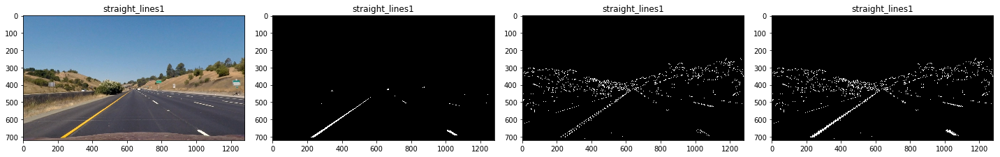

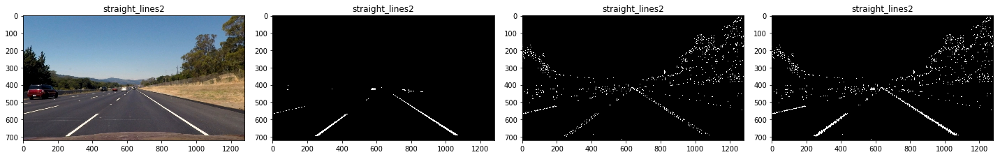

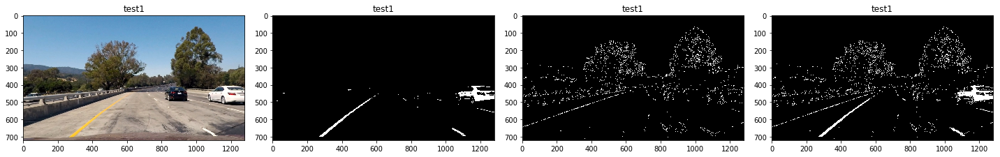

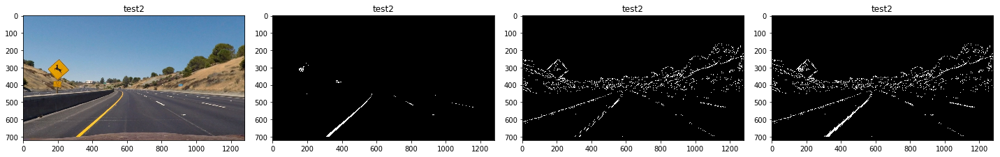

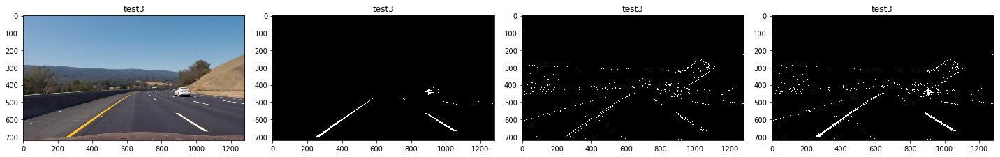

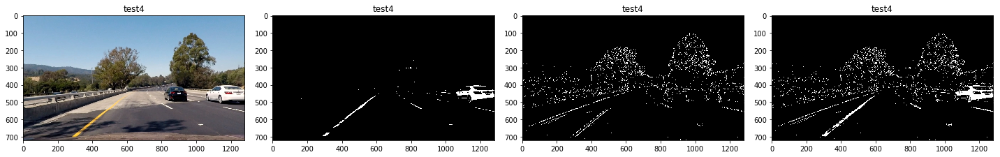

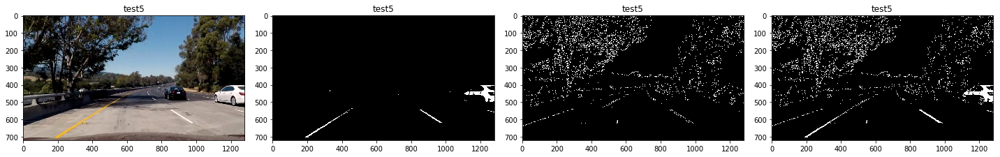

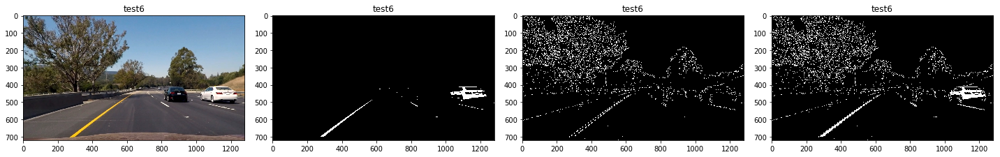

In [13]:
binary_combined = list(map(lambda b1,b2:combine_binary(b1,b2),sobel_combined,imgs_hsv))

final_comparison = list(zip(imgs_undistorted,imgs_hsv,sobel_combined,binary_combined))

for i,imgs in enumerate(final_comparison):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,name,name,name],
                  cols = 4, size = (20,20), isSave = True,
                  filename = 'readme_files/Combined{}'.format(i+1))

## Perspective Transform

In [14]:
def roi(img):
    
    height = img.shape[0]
    width  = img.shape[1]
    
    corner1 = [[int(45/100*width),int(64/100*height)]]
    corner2 = [[int(55/100*width),int(64/100*height)]]
    
    corner3 = [[int(14/100*width),height]]
    corner4 = [[int(86/100*width),height]]
    
    roi = np.array([corner1,corner2,corner3,corner4],dtype =np.float32)
    
    return roi 

def transformation_matrix(img):
    
    src = roi(img)
    
    img_size = (img.shape[1],img.shape[0])
    
    offset = 300
    x1 = offset
    x2 = img_size[0]-offset
    
    y1 = 0
    y2 = img_size[1]
    
    corner1 = [[x1,y1]]
    corner2 = [[x2,y1]]
    corner3 = [[x1,y2]]
    corner4 = [[x2,y2]]

    des = np.array([corner1,corner2,corner3,corner4],dtype=np.float32)
    M = cv2.getPerspectiveTransform(src,des)
    Minv = cv2.getPerspectiveTransform(des,src)
    
    return M , Minv
    
def warp(img,Matrix):
    
    img_size = (img.shape[1],img.shape[0])
    
    return cv2.warpPerspective(img,Matrix,img_size)

In [15]:
M,Minv = transformation_matrix(imgs_undistorted[0])

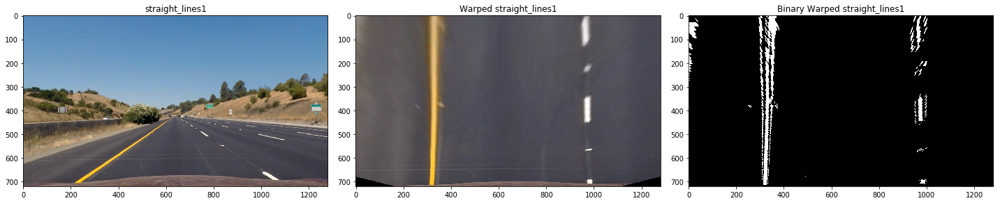

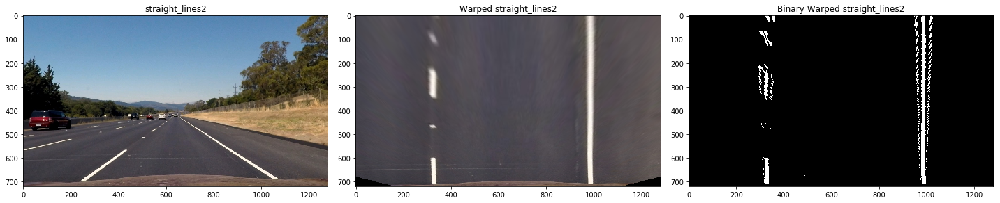

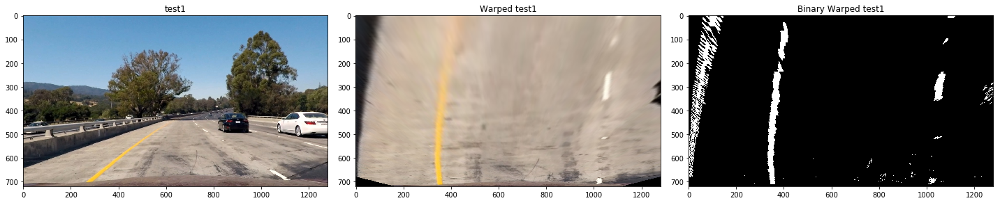

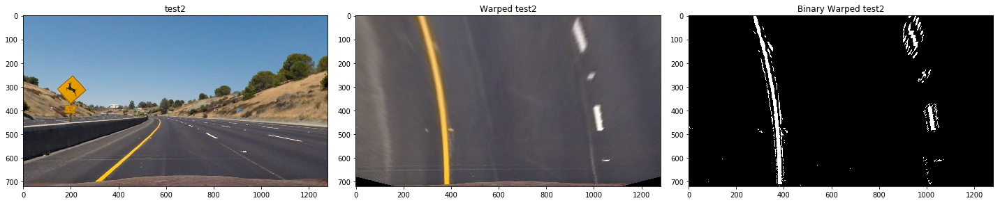

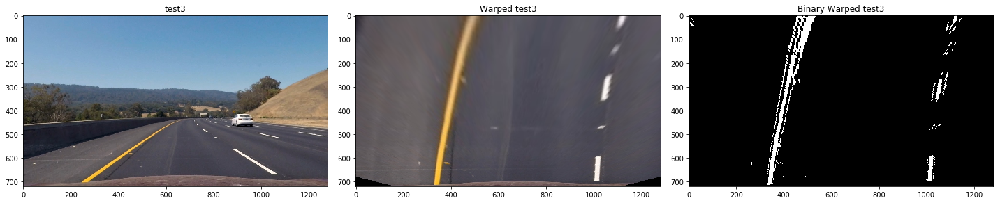

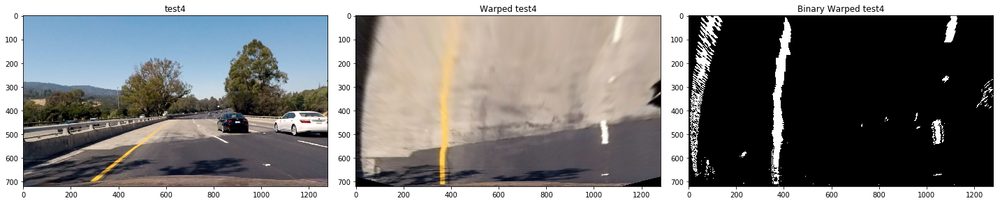

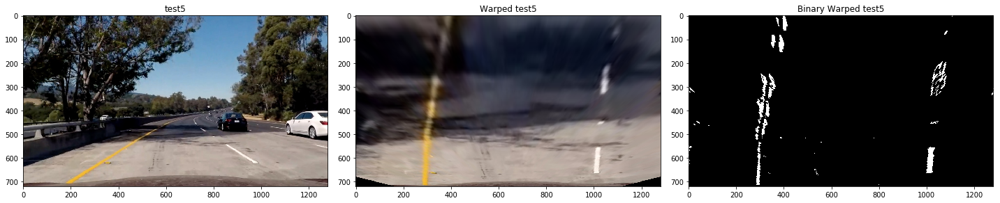

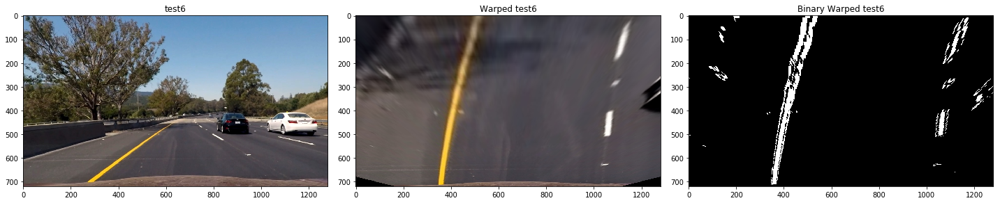

In [16]:
imgs_warped = list(map(lambda imgs:warp(imgs,M),imgs_undistorted))
binary_warped = list(map(lambda imgs: warp(imgs,M),binary_combined))

warped = list(zip(imgs_undistorted,imgs_warped,binary_warped))

for i,imgs in enumerate(warped):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,'Warped '+name,'Binary Warped '+name],
                  cols = 3, size = (20,20), isSave = True,
                  filename = 'readme_files/Warp{}'.format(i+1))

## Sliding Window algorithm

In [17]:
def starting_base(img):
    
    histogram = np.sum(img[int(img.shape[0]//1.5):,:], axis = 0 )
    midpoint = np.int(histogram.shape[0]//2)
    
    left_base = np.argmax(histogram[:midpoint])
    right_base = np.argmax(histogram[midpoint:]) + midpoint
    
    return left_base, right_base 
    
def sliding_window(img, nwindows = 21, margin = 70, minpix = 80):
    
    out_img = np.dstack((img, img, img))*255
    
    window_height = np.int(img.shape[0]//nwindows)
    nonzero = img.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    leftx_current, rightx_current = starting_base(img)
    
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        
        y_low = img.shape[0] - (window+1)*window_height
        y_high = img.shape[0] - window*window_height
        
        xleft_low = leftx_current - margin
        xleft_high = leftx_current + margin
        xright_low =rightx_current - margin 
        xright_high = rightx_current + margin
        
        #cv2.rectangle(out_img,(xleft_low,y_low),(xleft_high,y_high),(0,255,0),2)
        #cv2.rectangle(out_img,(xright_low,y_low),(xright_high,y_high),(0,255,0),2)
        
        good_left_inds = ((nonzeroy>=y_low) & (nonzeroy<y_high) &
                          (nonzerox>=xleft_low) & (nonzerox<xleft_high)).nonzero()[0]
        
        good_right_inds = ((nonzeroy>=y_low) & (nonzeroy<y_high) &
                           (nonzerox>=xright_low) & (nonzerox<xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds)>minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds)>minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        pass

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img 
        
def fit_polynomial(img,plot_onImage = False):
    
    leftx, lefty, rightx, righty, out_img = sliding_window(img)

    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)

    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ##Visualization
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    if plot_onImage == True:
        for i in range(0,len(ploty)-1):
            cv2.line(out_img,(int(left_fitx[i]),int(ploty[i])),(int(left_fitx[i+1]),int(ploty[i+1])),(255,255,0),4)
            cv2.line(out_img,(int(right_fitx[i]),int(ploty[i])),(int(right_fitx[i+1]),int(ploty[i+1])),(255,255,0),4)
    else:
        
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    
    return out_img


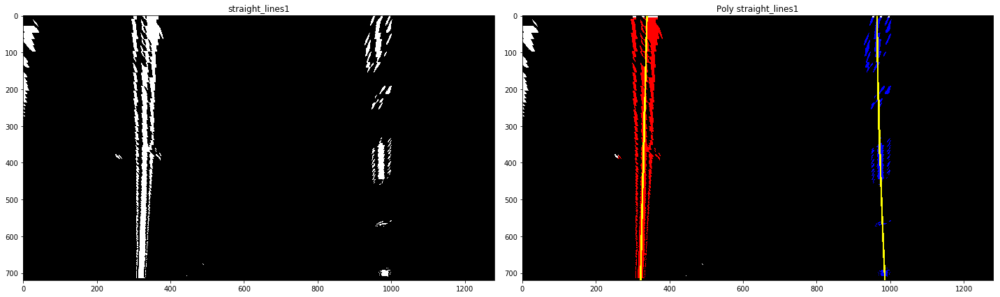

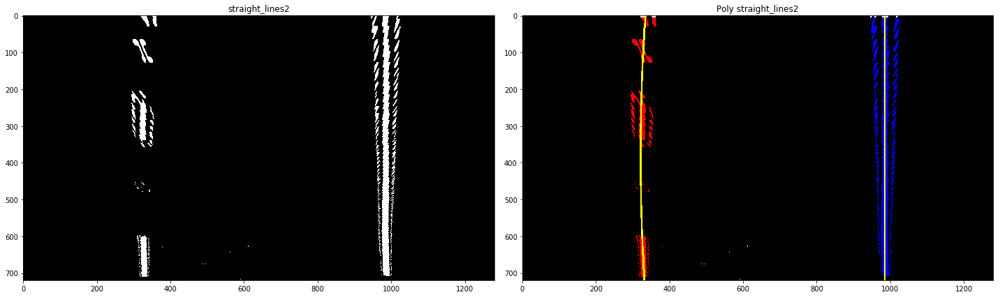

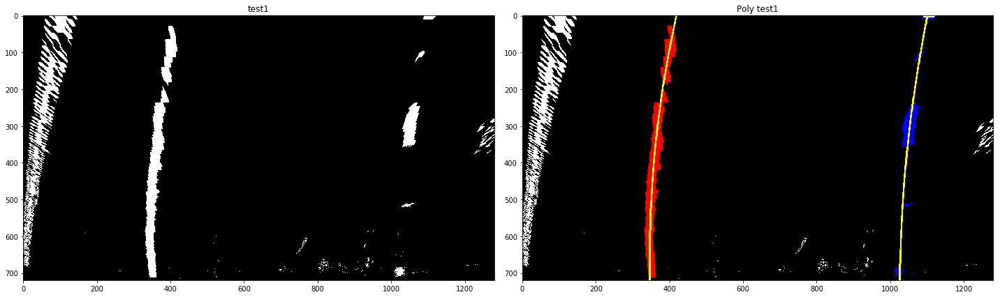

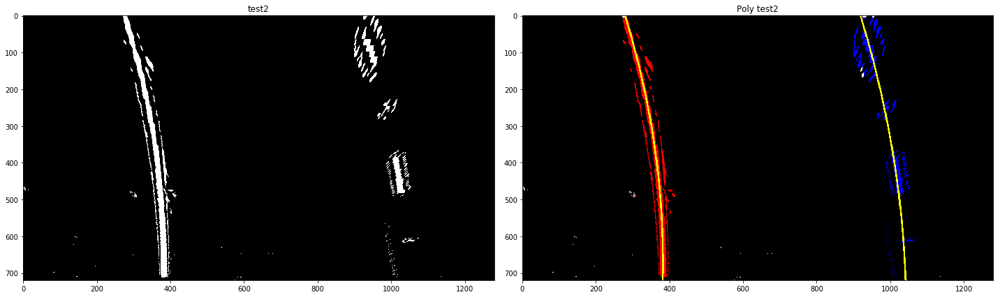

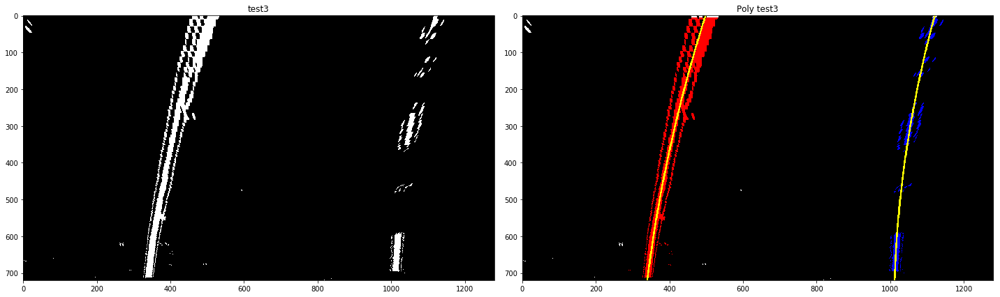

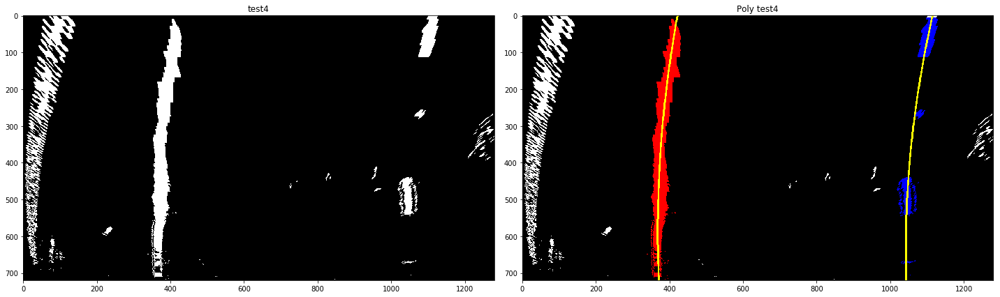

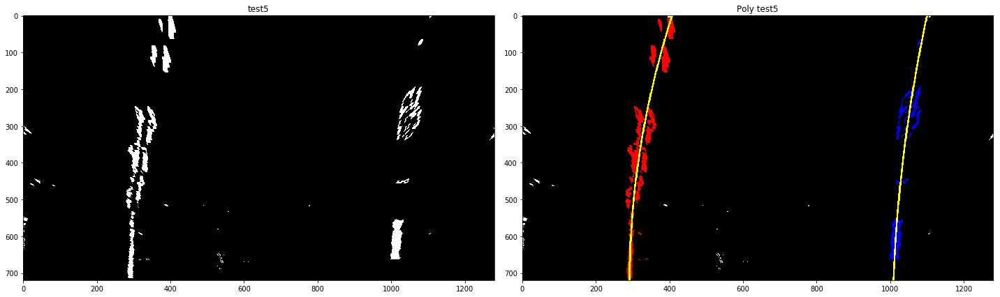

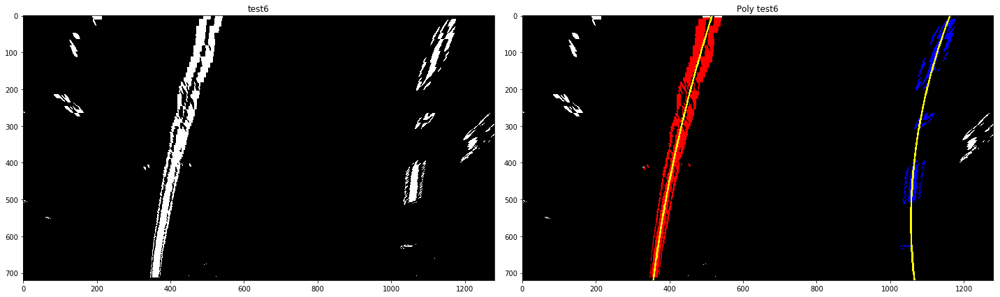

In [18]:
poly_fit = list(map(lambda img: fit_polynomial(img,True),binary_warped))

poly = list(zip(binary_warped,poly_fit))

for i,imgs in enumerate(poly):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,'Poly '+name],
                  cols = 2, size = (20,20), isSave = True,
                  filename = 'readme_files/poly{}'.format(i+1))

## Search from previous results

In [19]:
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

In [20]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):

    ploty = np.linspace(0, img_shape[0]-1,img_shape[0])
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    
    return left_fit,right_fit, ploty

def search_around_poly(img,margin = 150):
    
    nonzero = img.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    lx = left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
    rx = right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] 
    
    left_lane_inds = ((nonzerox>(lx-margin)) & (nonzerox<(lx+margin)))
    right_lane_inds = ((nonzerox>(rx-margin)) & (nonzerox<(rx+margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_f, right_f, ploty = fit_poly(img.shape, leftx, lefty, rightx, righty)

    left_fitx = left_f[0]*ploty**2 + left_f[1]*ploty + left_f[2]
    right_fitx = right_f[0]*ploty**2 + right_f[1]*ploty + right_f[2]
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((img, img, img))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result

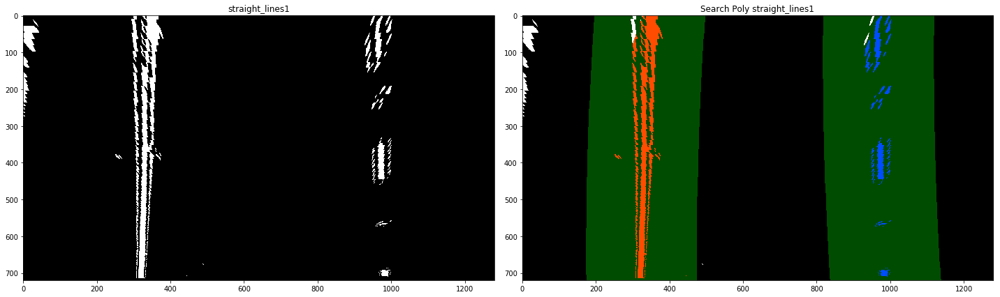

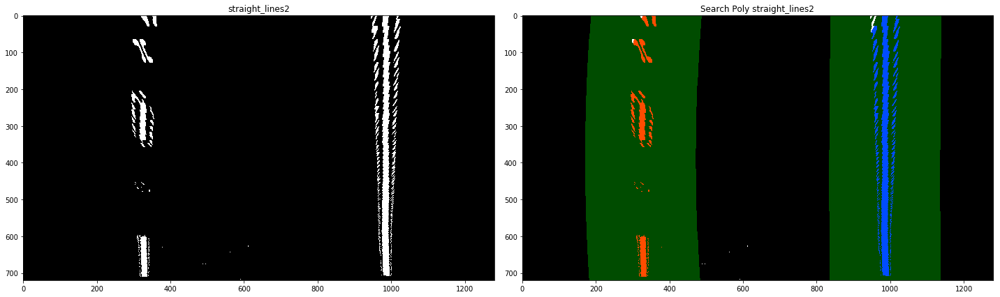

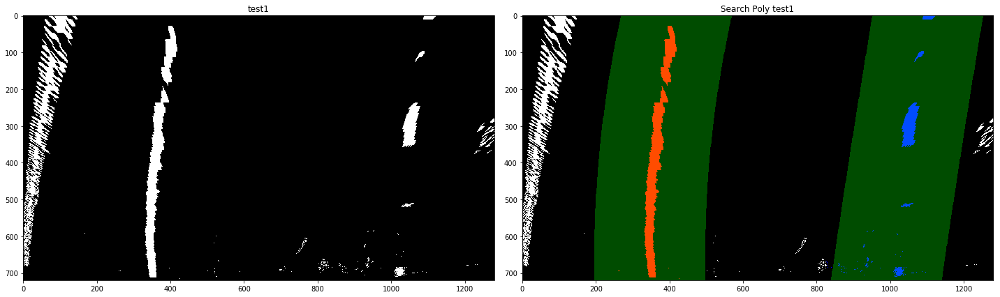

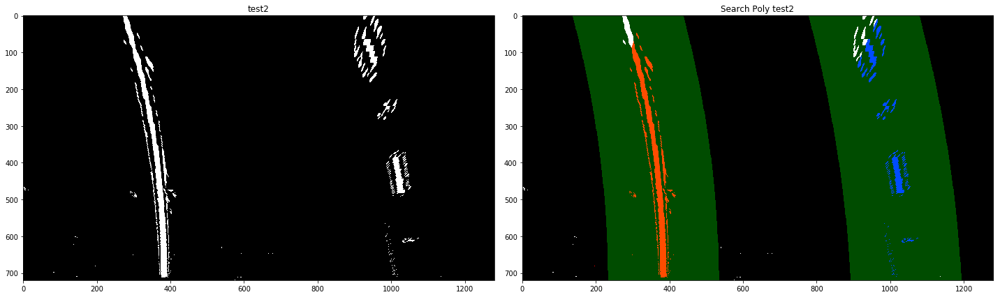

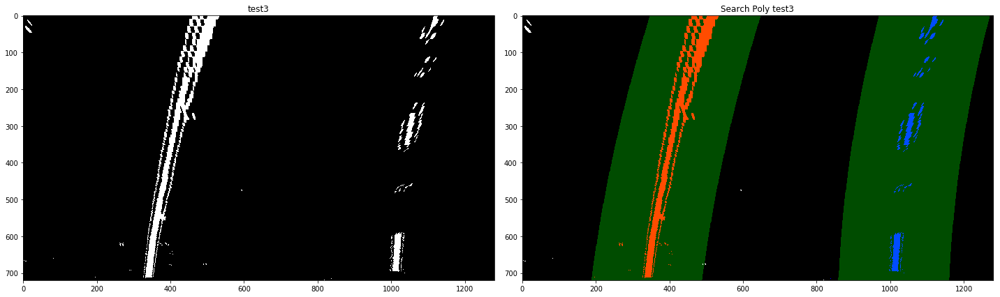

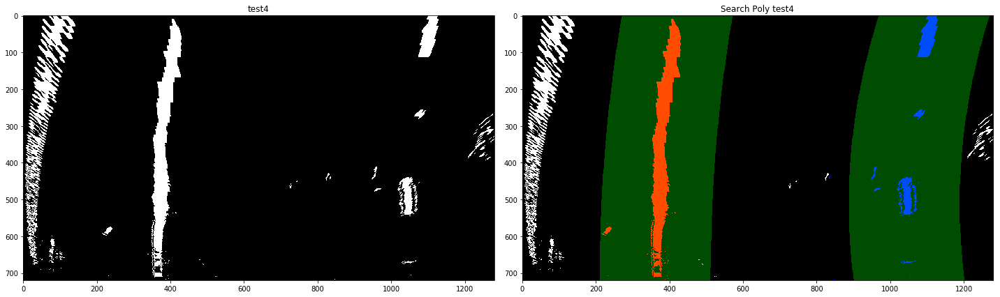

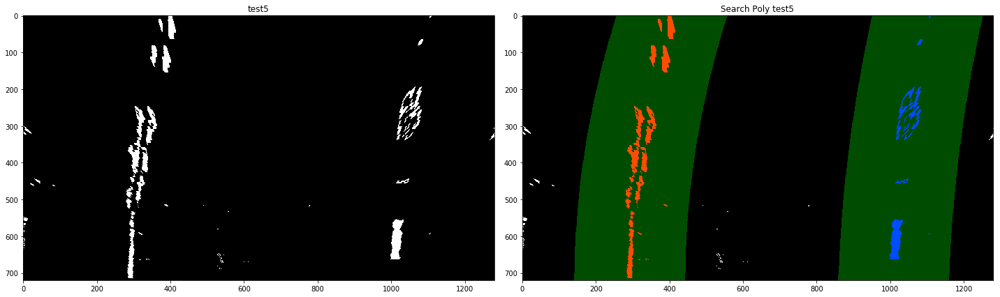

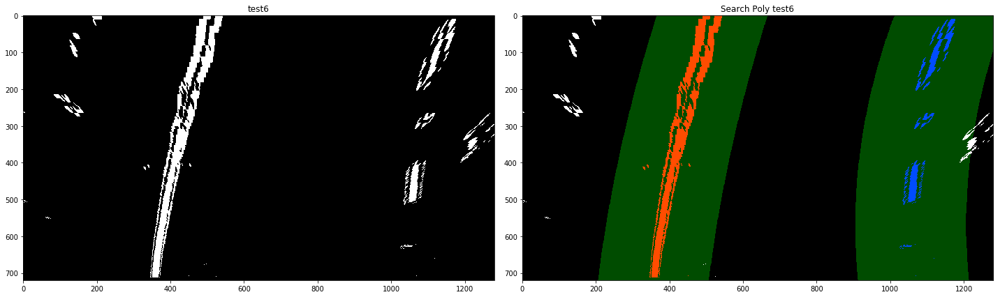

In [21]:
search_a = list(map(lambda img: search_around_poly(img),binary_warped))

search_a_illust = list(zip(binary_warped,search_a))

for i,imgs in enumerate(search_a_illust):
    name = imgs_name[i]
    name = name.replace('.jpg','')
    display_image(imgs,img_name = [name,'Search Poly '+name],
                  cols = 2, size = (20,20), isSave = True,
                  filename = 'readme_files/SearchPoly{}'.format(i+1))

## Calculating real world metrics

In [22]:
def fit_poly_real(img_shape, leftx, lefty, rightx, righty):

    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700
    
    ploty = np.linspace(0, img_shape[0]-1,img_shape[0])
    left_fit = np.polyfit(lefty*ym_per_pix,leftx*xm_per_pix,2)
    right_fit = np.polyfit(righty*ym_per_pix,rightx*xm_per_pix,2)
    
    return left_fit,right_fit, ploty

def measure_curvature_pixels(img): 
    
    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700
    margin = 100
    nonzero = img.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    lx = left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
    rx = right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] 
    
    left_lane_inds = ((nonzerox>(lx-margin)) & (nonzerox<(lx+margin)))
    right_lane_inds = ((nonzerox>(rx-margin)) & (nonzerox<(rx+margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fitx, right_fitx, ploty = fit_poly_real(img.shape, leftx, lefty, rightx, righty)
    
    y_eval = np.max(ploty)
    
    left_d1 = 2*left_fitx[0]*y_eval*ym_per_pix+left_fitx[1]
    left_d2 = 2*left_fitx[0]
    right_d1 = 2*right_fitx[0]*y_eval*ym_per_pix+right_fitx[1]
    right_d2 = 2*right_fitx[0]
    
    left_curverad = (1+(left_d1)**2)**1.5/left_d2  
    right_curverad = (1+(right_d1)**2)**1.5/right_d2
    
    return left_curverad, right_curverad

In [23]:
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

In [24]:
measure_curvature_pixels(binary_warped[1])

(1689.6973535164802, 1477.2616191822526)

# Pipeline
***

## Line() Class

The Line() Class will help store the previous states of the lane lines.  This will help in finding more accurate lane lines in succeeding frames.

In [25]:
class Line():
    
    def __init__(self):
        # has the first line been detected?
        self.detected = False
        
        # x values of the last n fits of the line
        self.recent_fitted_left = []
        self.recent_fitted_right = []
        
        # average x values of fitted line over the last n iterations
        self.bestx = None
        
        # polynomial coefficients averaged over the last n iterations
        self.n_poly_left = np.array([])
        self.n_poly_right = np.array([])
        
        # polynomial coefficients averaged over the last n iterations
        self.best_fit_left = []
        self.best_fit_right = []
        
        # polynomial coefficients for the most recent fit
        self.current_fit_left = [np.array([False])]
        self.current_fit_right = [np.array([False])]
        
        # radius of the curvature 
        self.radius_of_curvature = None
        
        # distance in meters of vehicle center from line
        self.line_base_pos = None
        
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0],dtype ='float')
        
        # all x values for detected line pixels
        self.allx = None
        
        # all y values for detected line pixels
        self.ally = None
        
        # The camera matrix as well as the distortion coefficients of the camera
        self.mtx, self.dist = calibrate()
        
        # Transformation Matrix to warp the image
        self.M = None
        
        # Transformation Matrix to unwarp the image
        self.Minv = None
        
        # conversion from pixel to meters
        self.ym_per_pix = 30/720 
        self.xm_per_pix = 3.7/700
        
        # center of image
        self.center = None
        
        
    def process_image(self,img):
            
        undistort_img = undistort(img,self.mtx,self.dist)
            
        if self.detected == False:
            self.M, self.Minv = transformation_matrix(undistort_img)
            self.center = img.shape[1]//2

        hsv_img = separateChannel(convert_hsv(undistort_img),thresh = (225,255))
        abs_sobel = abs_sobelx_thresh(undistort_img,thresh=[30,50])
        mag_sobel = mag_sobel_thresh(undistort_img,thresh=[30,100])
        dir_sobel = dir_sobel_thresh(undistort_img,thresh=[0.0,0.5])
                
        combined_sobel = combine_sobel(abs_sobel,mag_sobel,dir_sobel)
        binary_combined = combine_binary(hsv_img,combined_sobel)
        
        binary_warped = warp(binary_combined,self.M)
            
        return binary_warped
        
    def search_lines(self,img, nwindows = 9, margin = 70, minpix = 80):
    
        window_height = np.int(img.shape[0]//nwindows)
        nonzero = img.nonzero()
        nonzerox = np.array(nonzero[1])
        nonzeroy = np.array(nonzero[0])
    
        leftx_current, rightx_current = starting_base(img)
    
        left_lane_inds = []
        right_lane_inds = []
    
        for window in range(nwindows):
        
            y_low = img.shape[0] - (window+1)*window_height
            y_high = img.shape[0] - window*window_height
        
            xleft_low = leftx_current - margin
            xleft_high = leftx_current + margin
            xright_low =rightx_current - margin 
            xright_high = rightx_current + margin
        
            good_left_inds = ((nonzeroy>=y_low) & (nonzeroy<y_high) &
                              (nonzerox>=xleft_low) & (nonzerox<xleft_high)).nonzero()[0]
        
            good_right_inds = ((nonzeroy>=y_low) & (nonzeroy<y_high) &
                               (nonzerox>=xright_low) & (nonzerox<xright_high)).nonzero()[0]
        
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
        
            if len(good_left_inds)>minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds)>minpix:
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            pass

        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        return leftx, lefty, rightx, righty
        
    def continue_lines(self,img, margin = 70):
            
        nonzero = img.nonzero()
        nonzerox = np.array(nonzero[1])
        nonzeroy = np.array(nonzero[0])
            
        lx = self.best_fit_left[0]*(nonzeroy**2) + self.best_fit_left[1]*nonzeroy + self.best_fit_left[2]
        rx = self.best_fit_right[0]*(nonzeroy**2) + self.best_fit_right[1]*nonzeroy + self.best_fit_right[2] 
            
        left_lane_inds = ((nonzerox>(lx-margin)) & (nonzerox<(lx+margin)))
        right_lane_inds = ((nonzerox>(rx-margin)) & (nonzerox<(rx+margin)))
            
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
            
        return leftx, lefty, rightx, righty
        
    def fit_line(self,img,leftx,lefty,rightx,righty):
        
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        
        self.current_fit_left = np.polyfit(lefty,leftx,2)
        self.current_fit_right = np.polyfit(righty,rightx,2)
        
        alpha = 0.2
        
        if self.detected == False:
            self.best_fit_left = self.current_fit_left 
            self.best_fit_right = self.current_fit_right
            
        else:
            
            self.best_fit_left = self.best_fit_left*(1-alpha) + self.current_fit_left*alpha 
            self.best_fit_right = self.best_fit_right*(1-alpha) + self.current_fit_right*alpha 
        
        try:
            
            left_fitx = self.best_fit_left[0]*ploty**2 + self.best_fit_left[1]*ploty + self.best_fit_left[2]
            right_fitx = self.best_fit_right[0]*ploty**2 + self.best_fit_right[1]*ploty + self.best_fit_right[2]
                
            #self.best_fit_left = self.current_fit_left
            #self.best_fit_right = self.current_fit_right
            
            if self.detected == False:
                self.detected = True
                
        except TypeError:
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
                
        return left_fitx, right_fitx
    
    
    def curvature_lane(self,ploty,left_fitx,right_fitx):
        
        y_eval = np.max(ploty)
        
        left_fit_cr = np.polyfit(ploty*self.ym_per_pix,left_fitx*self.xm_per_pix,2)
        right_fit_cr = np.polyfit(ploty*self.ym_per_pix,right_fitx*self.xm_per_pix,2)
        
        ld1 = 2*left_fit_cr[0]*y_eval*self.ym_per_pix + left_fit_cr[1]
        ld2 = 2*left_fit_cr[0]
     
        rd1 = 2*right_fit_cr[0]*y_eval*self.ym_per_pix + right_fit_cr[1]
        rd2 = 2*right_fit_cr[0]
        
        left_curve = ((1+ld1**2)**1.5)/ld2  ## Implement the calculation of the left line here
        right_curve = ((1+rd1**2)**1.5)/rd2  ## Implement the calculation of the right line here
        
        # Calculating vehicle center--------------------------------------------------------------------------
        
        l_lane_b = self.best_fit_left[0]*y_eval**2 + self.best_fit_left[1]*y_eval + self.best_fit_left[2]
        r_lane_b = self.best_fit_right[0]*y_eval**2 + self.best_fit_right[1]*y_eval + self.best_fit_right[2]
        
        lane_center = (l_lane_b+r_lane_b)//2
    
        car_pos = (lane_center - self.center)*self.xm_per_pix
        
        return left_curve, right_curve, car_pos
        
    def project_line(self,original,warped_img,left_fitx,right_fitx):
            
        ploty = np.linspace(0,warped_img.shape[0]-1,warped_img.shape[0])
        
        warp_zero = np.zeros_like(warped_img).astype(np.uint8)
        window_img = np.dstack((warp_zero, warp_zero, warp_zero))*255

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right_line_window = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        
        line_pts = np.hstack((left_line_window, right_line_window))
        
        left_curvature, right_curvature, car_pos = self.curvature_lane(ploty,left_fitx,right_fitx)
        
        avg_curve = None
        if ((left_curvature>0) and (right_curvature>0)):
            avg_curve = (left_curvature+right_curvature)/2
        elif ((left_curvature<0) and (right_curvature<0)):
            avg_curve = (left_curvature+right_curvature)/2
        else:
            avg_curve = left_curvature
        
        pos = "left" if car_pos < 0 else "right"

        string1 = "Average curvature: {:.2f}".format(avg_curve)
        string2 = "Vehicle is {:.2f}m to the {}".format(car_pos,pos)
        
        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([line_pts]), (0,255, 0))
                
        final = warp(window_img,self.Minv)
                
        result = cv2.addWeighted(original, 1, final, 0.3, 0)
        cv2.putText(result,string1,(100,100),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),3,cv2.LINE_AA,False)  
        cv2.putText(result,string2,(100,200),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),3,cv2.LINE_AA,False)
        
        return result
            
            
    def process_video(self,img):
        
        #copy_img = mpimg.imread(img)
        copy_img = np.copy(img)
        warped_img = self.process_image(copy_img)
            
        leftx = None
        lefty = None
        rightx = None
        righty = None
            
        if self.detected==False:
            leftx, lefty, rightx, righty = self.search_lines(warped_img,9,70,80)
            
        else:
            leftx, lefty, rightx, righty = self.continue_lines(warped_img,80)
            
        left_fitx, right_fitx = self.fit_line(warped_img,leftx,lefty,rightx,righty)
            
        final = self.project_line(copy_img,warped_img,left_fitx,right_fitx)
            
        return final   
        

## Process flow

Now it is time to put it all together to create our pipeline in order to better detect lane lines in an image or video. The following functions will be used in order to achieve that goal:

**Note: dont forget to add all the details of the pipeline**

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [27]:
line1 = Line()

white_output = 'video_outputs/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(line1.process_video) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video video_outputs/project_video.mp4.
Moviepy - Writing video video_outputs/project_video.mp4



Moviepy - Done !
Moviepy - video ready video_outputs/project_video.mp4
Wall time: 4min 2s


In [28]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [29]:
clip = VideoFileClip(white_output).subclip('0:00:02','0:00:011').resize(0.4)
clip.write_gif("readme_files/challenge.gif", fps=25, program = 'ffmpeg')

t:   0%|                                                                             | 0/225 [00:00<?, ?it/s, now=None]

MoviePy - Building file  readme_files/challenge.gif
MoviePy - - Generating GIF frames.


MoviePy - - File ready: readme_files/challenge.gif.
